In [10]:
import pandas as pd 

lodopab_ct = pd.read_csv('lodopab_ct_denoising_metrics.txt', header=None)

In [11]:
psnr = lodopab_ct.iloc[:,0].to_numpy()
ssim = lodopab_ct.iloc[:,1].to_numpy()

In [12]:
psnr.mean(), ssim.mean()

(32.44808253883045, 0.8893766113117546)

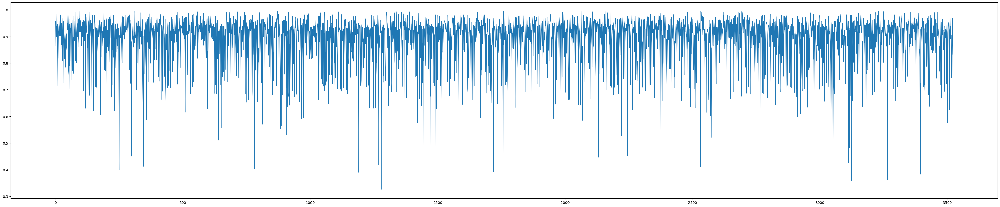

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize=(50,10))
plt.plot(ssim)

In [14]:
# Find which has least ssim
import numpy as np
min_index = ssim.argmin()
print(min_index, ssim[min_index])
print(ssim.argmax(), ssim[ssim.argmax()])

1280 0.32566518
1336 0.9948865


In [15]:

# Find which has least psnr 
import numpy as np
np.min(ssim)
min_index = psnr.argmin()
min_index
print(min_index, psnr[min_index])

1280 11.260494617646472


number of image paths :  28
validation data image len : , 28
with wavelet swap + postprocessing
11.26788974688078,0.2232708
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])
plain model outptu
9.18781354029862,0.17678136
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])
with wavelet swap + postprocessing
22.192392141837722,0.80667216
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])
plain model outptu
21.01403466338536,0.74754596
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])


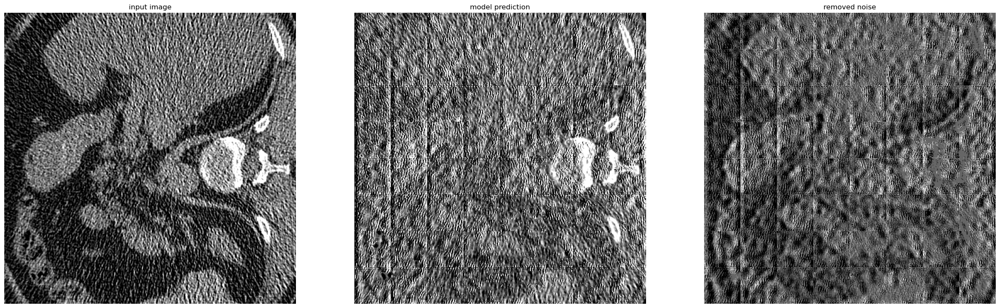

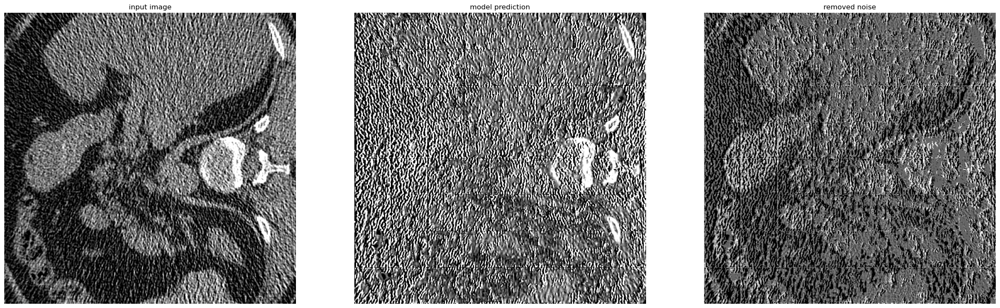

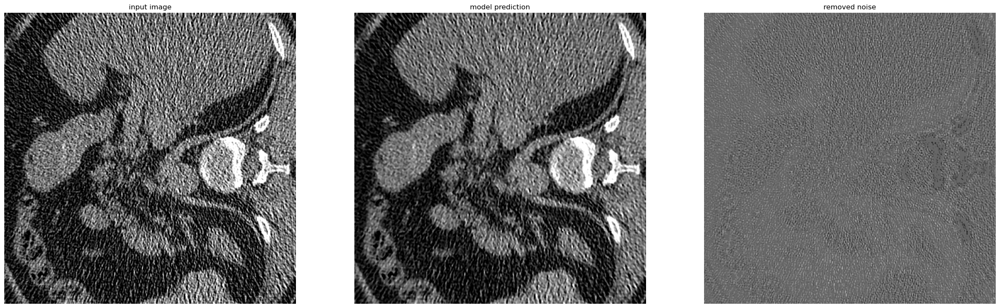

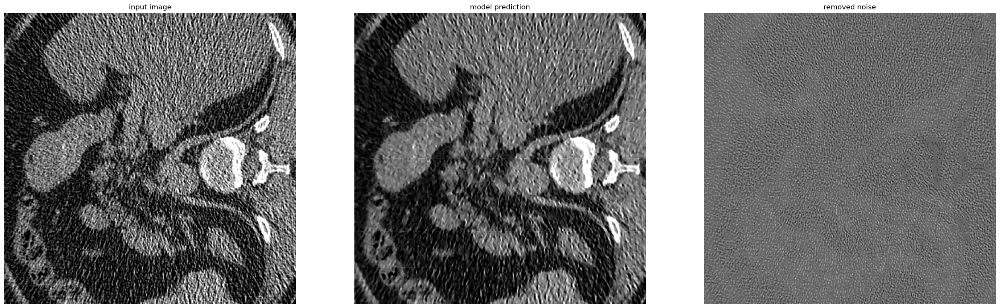

In [22]:

import sys
sys.path.append('../')
sys.path.append('../../')
import torch
from dataloader_lodopab_ct import get_validation_dataloader
import matplotlib.pyplot as plt
import numpy as np
from data_importer import load_training_images, load_testing_images, trunc, denormalize


import numpy as np
import scipy.signal

from skimage.metrics import structural_similarity as ssim
def compute_MSE(img1, img2):
    return np.mean(np.square(img1 - img2))

def compute_PSNR(img1, img2, data_range):
    mse_ = compute_MSE(img1, img2)
    return 10 * np.log10((data_range ** 2) / mse_)

def calculate_ssim(original_image, reconstructed_image):    
    ssim_value = ssim(original_image.astype(np.float32), reconstructed_image.astype(np.float32), win_size=7,  channel_axis=2, data_range=240+160)
    return ssim_value



def patch_extractor(image, patch_width=64, patch_height=64):
    image = image.copy()
    num_images, image_height, image_width, channels = image.shape
    patches = image.reshape(-1, image_height // patch_height, patch_height, image_width // patch_width, patch_width, channels)
    patches = patches.swapaxes(2, 3)
    patches = patches.reshape(-1, patch_height, patch_width, channels)
    
    return torch.from_numpy(patches)


validation_dataloader = get_validation_dataloader(root_dataset_dir='../../../../../../Dataset/LoDoPaB-CT/ground_truth_validation', shuffle=False)


def reconstruct_image_from_patches(patches, num_patches_per_row):
    patch_size = patches.shape[1]  # Assuming square patches
    num_patches = patches.shape[0]

    # Calculate the number of rows
    num_patches_per_col = num_patches // num_patches_per_row

    # Initialize an empty image to store the reconstructed result
    reconstructed_image = np.zeros((num_patches_per_col * patch_size, num_patches_per_row * patch_size))

    # Reshape the patches into a 2D array
    patches_2d = patches.reshape((num_patches_per_col, num_patches_per_row, patch_size, patch_size))

    # Reconstruct the image by placing each patch in its corresponding position
    for i in range(num_patches_per_col):
        for j in range(num_patches_per_row):
            reconstructed_image[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size] = patches_2d[i, j]

    return np.expand_dims(reconstructed_image, axis=-1)



#import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import cv2
import os
import sys
sys.path.append('../')
sys.path.append('../../')

import tensorflow as tf
from tensorflow.keras import layers, models


def visualize_patches(patches, noisy_images,  num_images):
    num_patches_per_image = patches.shape[0] // num_images
    for i in range(num_images):
        
        image_patches = patches[i * num_patches_per_image:i * num_patches_per_image + num_patches_per_image]
        noisy_patches = noisy_images[i * num_patches_per_image:i * num_patches_per_image + num_patches_per_image]
        
        reconstruct_image = (trunc(denormalize((reconstruct_image_from_patches(image_patches, 8)))))
        _noisy_image = trunc(denormalize(reconstruct_image_from_patches(noisy_patches, 8)))
        
        print(str(compute_PSNR(_noisy_image, reconstruct_image, 240.0 + 160.0)) + "," + str(
              calculate_ssim(_noisy_image, reconstruct_image)))

        
        fig, axes = plt.subplots(1, 3, figsize=(30, 30))
        axes = axes.flatten()
        print('range of reconstructed image : ', np.min(reconstruct_image), np.max(reconstruct_image))

        print('reconstruct_image shape : ', reconstruct_image.shape)
        print('noisy image shape : ', noisy_images[i].shape)
        
        axes[0].set_title('input image')
        axes[0].imshow(_noisy_image, cmap='gray', vmin=-160.0, vmax=240.0)
        axes[0].axis('off')
        
        
        axes[1].set_title('model prediction')
        axes[1].imshow((reconstruct_image), cmap='gray', vmin=-160.0, vmax=240.0)
        axes[1].axis('off')
        
        axes[2].set_title('removed noise')
        axes[2].imshow(trunc(_noisy_image - reconstruct_image), cmap='gray', vmin=-160.0, vmax=240.0)
        axes[2].axis('off')
        
        

def get_noise_type_identification_model():
    model = models.Sequential()

    model.add(layers.Input(shape=(64, 64, 1)))

    model.add(layers.Conv2D(5, (3, 3),  padding='same'))
    model.add(layers.Dropout(0.1)) 

    model.add(layers.MaxPooling2D(pool_size=(2,2), strides=(2, 2)))

    model.add(layers.Conv2D(50, (8, 8),  padding='same'))
    model.add(layers.Dropout(0.1)) 

    model.add(layers.MaxPooling2D(pool_size=(2,2), strides=(2, 2)))

    model.add(layers.Flatten())

    model.add(layers.Dense(4, activation='softmax'))
 
    model.compile(optimizer='sgd', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.load_weights('../../preprocessing_w_hformer/weights/saved_noise_type_model.h5')
    
    return model

def denoise_image(model, images):
    #print('before denoising, shape of images is : ', images.shape)
    #print('shape of each image : ', images[0].shape)
    noise_types = model.predict(images.cpu().numpy(), verbose=0)
    images = images.cpu().numpy()
    num_images = images.shape[0]
    
    denoised_images = [None] * num_images
   
    NOISE_TYPE_IMPULSE = 0
    NOISE_TYPE_GAUSSIAN = 1
    NOISE_TYPE_SPECKLE = 2
    NOISE_TYPE_POISSON = 3
     
    for i in range(num_images):
        noise_type = np.argmax(noise_types[i])
        #print('noise type identified : ', noise_type)
        #print(noise_type)
        if (noise_type == NOISE_TYPE_IMPULSE):
            image_after_median_filter = cv2.medianBlur(images[i], 3)
            denoised_images[i] = image_after_median_filter
        elif (noise_type == NOISE_TYPE_GAUSSIAN):
            image_after_gaussian_blur = cv2.GaussianBlur(images[i], (3, 3), 0)
            denoised_images[i] = image_after_gaussian_blur
        elif (noise_type == NOISE_TYPE_SPECKLE):
            image_after_median_filter = cv2.medianBlur(images[i], 3)
            denoised_images[i] = image_after_median_filter
        elif (noise_type == NOISE_TYPE_POISSON):
            image_after_nlm = cv2.fastNlMeansDenoising((images[i] * 255).astype(np.uint8), None, 10, 5, 15) 
            denoised_images[i] = image_after_nlm
            

        #plt.imshow(images[i], 'gray')
        #plt.show()
        #plt.imshow(denoised_images[i], 'gray')
        #plt.show() 
    return denoised_images
 
        
            
noise_type_identifier = get_noise_type_identification_model()

from pytorch_wavelets import DTCWTForward, DTCWTInverse
dwt = DTCWTForward(J=3).cuda()
idwt = DTCWTInverse().cuda()

def evaluate_model_wavelet_swap(model, history, name, psnr_or_accuracy, index):
    j = 0
    with torch.no_grad():    
        for i, data in enumerate(validation_dataloader):
            _noisy = data
            for noisy in _noisy:
                
                if j != index:
                    j = j + 1
                    continue
                noisy = torch.squeeze(noisy, 0).cuda()
            
                predictions = model(noisy)
                prediction_img = torch.transpose(predictions, 1, 3)
                transposed_noisy_image = torch.transpose(noisy, 1, 3)

                prediction_approx, prediction_high_freq = dwt(prediction_img.cuda())
                prediction_high_freq_low, prediction_high_freq_mid, prediction_high_freq_coarse = prediction_high_freq[0], prediction_high_freq[1], prediction_high_freq[2]

                noisy_approx, noisy_high_freq = dwt(transposed_noisy_image.cuda())

                noisy_high_freq_fine, noisy_high_freq_mid, noisy_high_freq_coarse = noisy_high_freq[0], noisy_high_freq[1] , noisy_high_freq[2]
                black_image = torch.zeros(noisy_approx.shape).cuda()

                reconstructed_prediction_image_with_high_freq_swap = idwt((black_image, noisy_high_freq))
                reconstructed_prediction_image_with_high_freq_swap = torch.transpose(reconstructed_prediction_image_with_high_freq_swap, 3, 1)
                noise_type =  noise_type_identifier.predict(reconstructed_prediction_image_with_high_freq_swap.detach().cpu().numpy(), verbose=0)
                denoised_high_freq = denoise_image(noise_type_identifier, reconstructed_prediction_image_with_high_freq_swap)
                denoised_high_freq = np.expand_dims(np.array(denoised_high_freq), -1)


                denoise_high_freq = torch.transpose(torch.from_numpy(denoised_high_freq), 1, 3)
                _, denoised_high_freq = dwt(denoise_high_freq.cuda())
                denoised_high_freq_fine, denoised_high_freq_mid, denoised_high_freq_coarse = denoised_high_freq[0], denoised_high_freq[1], denoised_high_freq[2]

                wavelet_high_freq_swapped = [None] * 3
                wavelet_high_freq_swapped[0] =prediction_high_freq_low 
                wavelet_high_freq_swapped[1] = denoised_high_freq_mid
                wavelet_high_freq_swapped[2] =denoised_high_freq_coarse

                reconstructed_prediction_image = idwt((prediction_approx,wavelet_high_freq_swapped))
                reconstructed_prediction_image = torch.transpose(reconstructed_prediction_image, 1, 3)

                prediction_patches = predictions.detach().cpu()
                noisy_patches = noisy.detach().cpu()

                print('with wavelet swap + postprocessing')
                visualize_patches(reconstructed_prediction_image.detach().cpu(), noisy_patches, 1)
                print('plain model outptu')
                visualize_patches(prediction_patches, noisy_patches, 1)
                return
                j = j + 1

        
    
import sys
sys.path.append('../')
sys.path.append('../../preprocessing_w_hformer')

from torchinfo import summary

from hformer_minimal_model import HformerModel 

model = HformerModel(num_channels=16).cuda()
model.load_state_dict(torch.load('../../preprocessing_w_hformer/weights/min_no_preprocessing_model_119.pth'))
model.eval()

evaluate_model_wavelet_swap(model, None, 'hformer_64_extended_partial_epoch', 'psnr', 1280)

from hformer_model import HformerModel
model = HformerModel(num_channels=64).cuda()
model.load_state_dict(torch.load('../weights/model_78.pth'))
model.eval()

evaluate_model_wavelet_swap(model, None, 'hformer_64_extended_partial_epoch', 'psnr', 1280)
    

with wavelet swap + postprocessing
35.41970170048743,0.97113556
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])
plain model outptu
41.42861748000322,0.9887198
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])
with wavelet swap + postprocessing
35.16959611549139,0.969725
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])
plain model outptu
40.29729277073198,0.9874128
range of reconstructed image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  torch.Size([64, 64, 1])


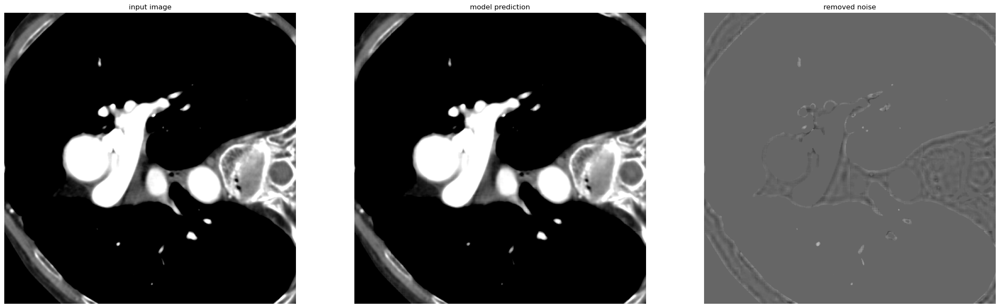

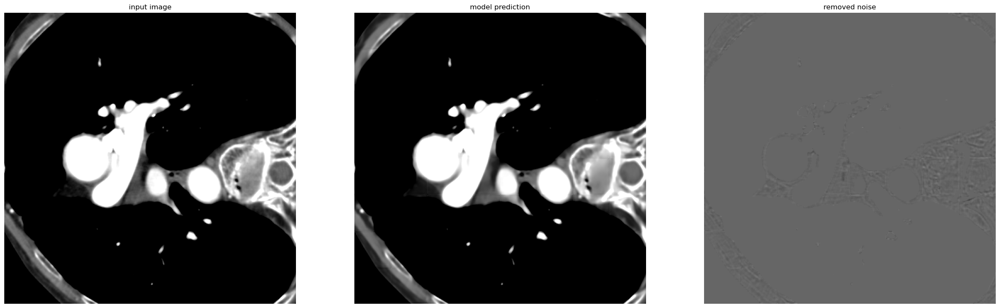

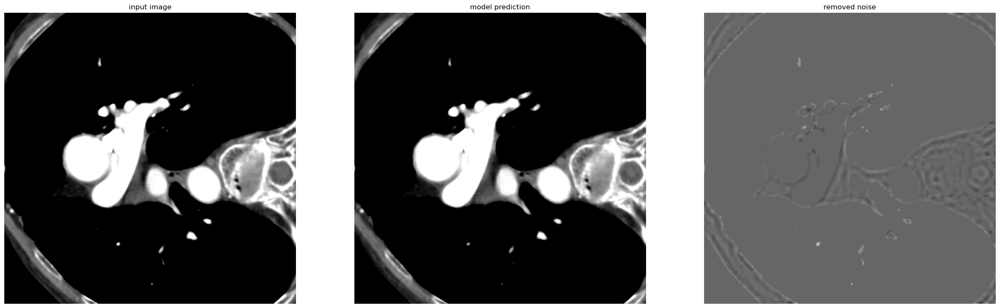

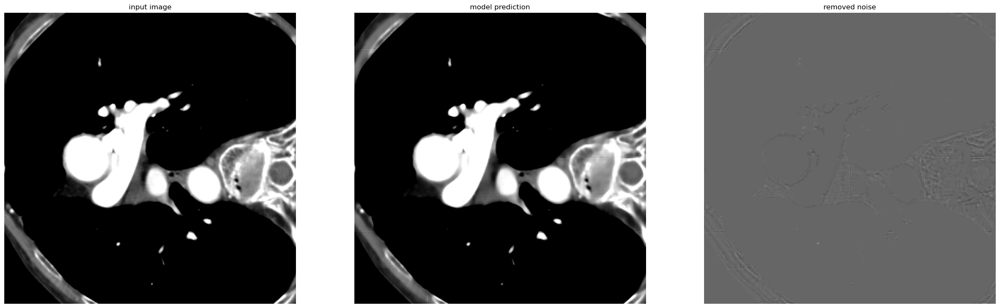

In [23]:

import sys
sys.path.append('../')
sys.path.append('../../preprocessing_w_hformer')

from torchinfo import summary

from hformer_minimal_model import HformerModel 

model = HformerModel(num_channels=16).cuda()
model.load_state_dict(torch.load('../../preprocessing_w_hformer/weights/min_no_preprocessing_model_119.pth'))
model.eval()

evaluate_model_wavelet_swap(model, None, 'hformer_64_extended_partial_epoch', 'psnr', 1336)

from hformer_model import HformerModel
model = HformerModel(num_channels=64).cuda()
model.load_state_dict(torch.load('../weights/model_78.pth'))
model.eval()

evaluate_model_wavelet_swap(model, None, 'hformer_64_extended_partial_epoch', 'psnr', 1336)
    